# Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import time
import math

import torch
import torch.nn.functional as F
from torch import nn, Tensor
from torchvision import datasets, transforms

# Importing our existing flow funcs
import os
import sys
from pathlib import Path
# Add parent directory to sys.path
parent_dir = Path.cwd().parent
sys.path.append(str(parent_dir))
# Import modules
from analytic_flow_funcs import compute_linear_velocity_batch, forward_euler_integration_analytic_linear, compute_predictions
from image_display_funcs import (plot_labelled_images, plot_image, visualize_image_trajectory, 
                                image_trajectory_animation, find_closest_matches, display_comparisons, plot_save_image)

os.makedirs("results", exist_ok=True)

# Set device (automatically detects GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


# Load and Display ImageNet

ImageNet subset shape: torch.Size([64, 3, 64, 64])
Noise samples shape: torch.Size([5, 3, 64, 64])


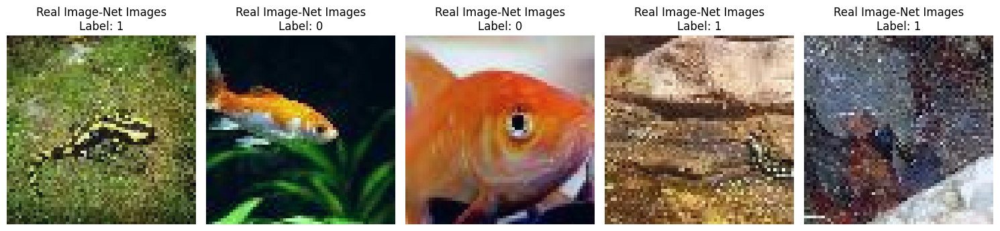

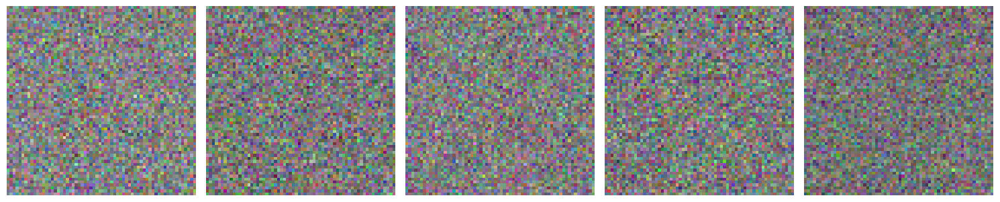

In [2]:
# Define transforms (resize to 64x64 for Tiny ImageNet)
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet stats
                         std=[0.229, 0.224, 0.225])
])

# Load dataset (assuming you unzipped to ./data/tiny-imagenet-200)
train_path = './data/tiny-imagenet-200/train/'  # Use train/ or val/

try:
    # Load Tiny ImageNet subset (first 5000 images)
    dataset = datasets.ImageFolder(train_path, transform=transform)
    subset = torch.utils.data.Subset(dataset, range(1000))  # Adjust subset size as needed
    
    # DataLoader
    dataloader = torch.utils.data.DataLoader(subset, batch_size=64, shuffle=True)
    
    # Check stats
    images, labels = next(iter(dataloader))
    images, labels = images.to(device), labels.to(device) 

    # Generate Gaussian noise samples (same shape as CIFAR-10)
    num_noise_samples = 5
    image_shape = images[0].shape 
    noise_samples = torch.randn(size=(num_noise_samples, *image_shape),  # [5, 3, 224, 224]
                        device=device)
    
    # Display results
    print(f"ImageNet subset shape: {images.shape}")  # [5000, 3, 32, 32] on device
    print(f"Noise samples shape: {noise_samples.shape}")  # [5, 3, 32, 32] on same device
    
    plot_labelled_images(images, n_samples=5, title="Real Image-Net Images", labels=labels)
    plot_image(noise_samples, n_samples=5)

except FileNotFoundError:
    print("Error: Tiny ImageNet not found. Check the path!")

# Analytic Flow-Matching

In [3]:
# Run integration
start_time = time.time()
num_steps = 50

trajectory = forward_euler_integration_analytic_linear(
    initial_points=noise_samples,
    data=images,
    t_start=0.0,
    t_end=1.0, 
    num_steps=num_steps,
    sigma_i=1.0
)

# Calculate elapsed time
elapsed_time = time.time() - start_time
print(f"Integration completed in {elapsed_time:.4f} seconds")

Integration completed in 0.2609 seconds


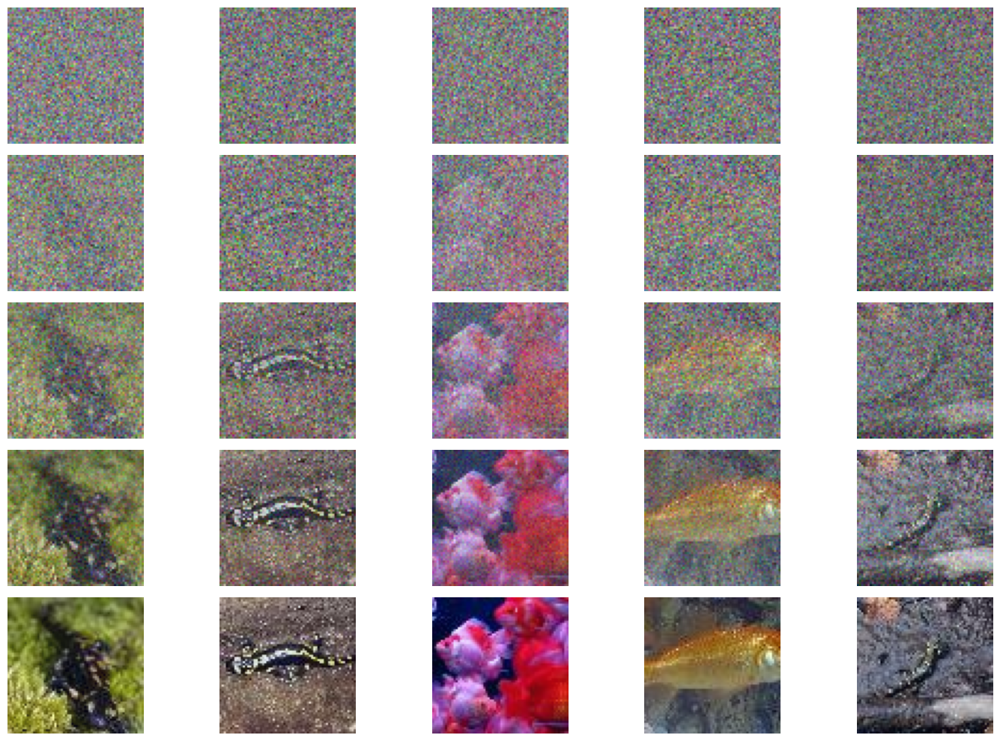

In [4]:
# Example usage
visualize_image_trajectory(trajectory, num_time_points=5)

In [5]:
ani = image_trajectory_animation(trajectory)
ani.save('results/image_net_analytic_denoising.gif', writer='pillow', fps=20, dpi=80)

# To display in Jupyter notebook:
from IPython.display import HTML
HTML(ani.to_jshtml())

# Visualizing Predictions Over Time

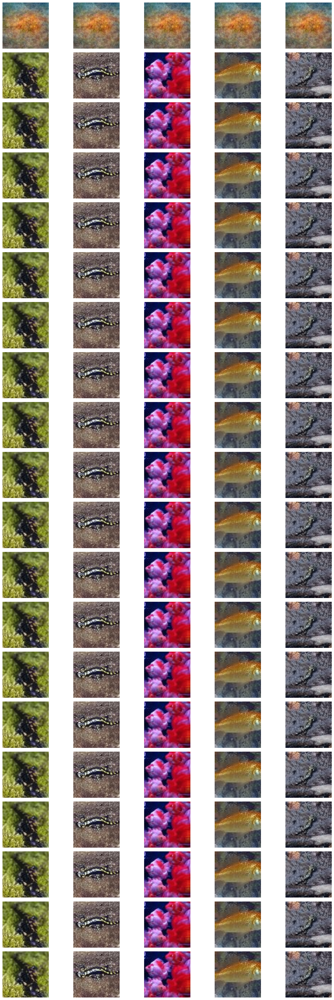

In [6]:
predictions = compute_predictions(trajectory, num_steps=num_steps)
visualize_image_trajectory(predictions, num_time_points=min(num_steps, 20))  # Show time points

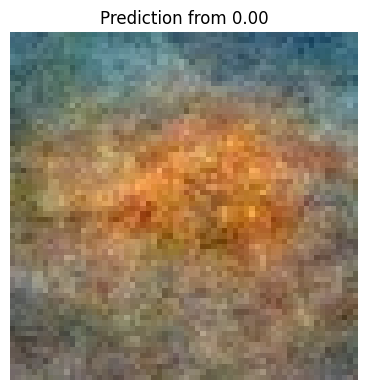

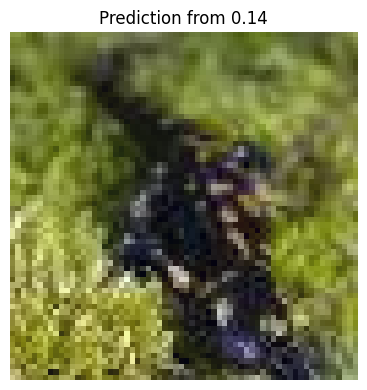

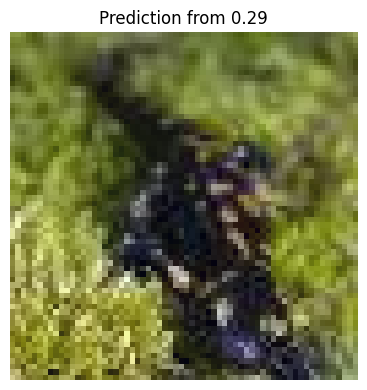

In [7]:
image = predictions[0, 0]
time_value = 0
filename = f'results/CIFAR-10_at_{time_value:.2f}.png'
title = f'Prediction from {time_value:.2f}'
plot_save_image(image, figsize=(4, 4), filename=filename, title=title)

x = (int)(0.15*num_steps)
image = predictions[x, 0]
time_value = x/len(predictions)
filename = f'results/CIFAR-10_at_{time_value:.2f}.png'
title = f'Prediction from {time_value:.2f}'
plot_save_image(image, figsize=(4, 4), filename=filename, title=title)

x = (int)(0.3*num_steps)
image = predictions[x, 0]
time_value = x/len(predictions)
filename = f'results/CIFAR-10_at_{time_value:.2f}.png'
title = f'Prediction from {time_value:.2f}'
plot_save_image(image, figsize=(4, 4), filename=filename, title=title)

# Checking For Matching Images

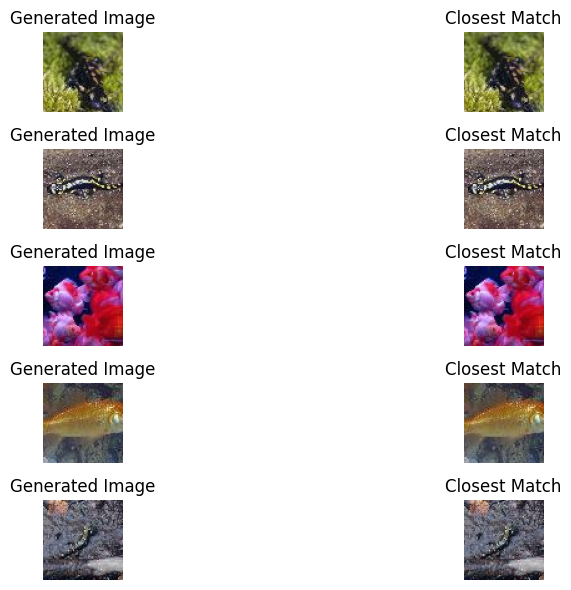

In [8]:
# Get final images from trajectory
generated_images = trajectory[-1] 

min_mses, closest_indices = find_closest_matches(
    generated_images, images, device = device)

# Display comparisons
display_comparisons(generated_images, images, 
                   closest_indices,
                   num_display=5,
                    filename="results/analytic_comparison.png")

# Fixed Seed Noise

In [9]:
# Set fixed seed for reproducibility
seed = 2
torch.manual_seed(seed)

# Generate noise samples
num_noise_samples = 5
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
noise_samples = torch.randn(size=(num_noise_samples, *image_shape),  # [5, 3, 224, 224]
                        device=device)

# Create directory if it doesn't exist
os.makedirs('saved_samples', exist_ok=True)

# Save both the samples and the seed
torch.save({
    'seed': seed,
    'noise_samples': noise_samples.cpu()  # Move to CPU before saving
}, 'saved_samples/noise_samples.pt')

print(f"Saved {num_noise_samples} noise samples with seed {seed}")

Saved 5 noise samples with seed 2


In [10]:
# Load the saved data
saved_data = torch.load('saved_samples/noise_samples.pt')

# Extract components
seed = saved_data['seed']
noise_samples = saved_data['noise_samples']

# Verify reproducibility by regenerating with same seed
torch.manual_seed(seed)
regenerated = torch.randn(size=(num_noise_samples, *image_shape),  # [5, 3, 224, 224]
                        device=device)

# Move back to original device if needed
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
noise_samples = noise_samples.to(device)

print(f"Loaded {len(noise_samples)} samples generated with seed {seed}")

Loaded 5 samples generated with seed 2


Noise samples shape: torch.Size([5, 3, 64, 64])


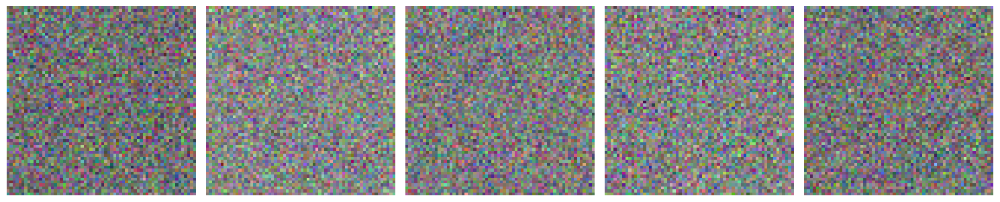

In [11]:
print(f"Noise samples shape: {noise_samples.shape}")  # [4, 1, 28, 28] on same device
plot_image(noise_samples, n_samples = 5)

In [12]:
# Run integration
start_time = time.time()
num_steps = 50

trajectory = forward_euler_integration_analytic_linear(
    initial_points=noise_samples,
    data=images,
    t_start=0.0,
    t_end=1.0, 
    num_steps=num_steps,
    sigma_i=1.0
)

# Calculate elapsed time
elapsed_time = time.time() - start_time
print(f"Integration completed in {elapsed_time:.4f} seconds")

Integration completed in 0.0427 seconds


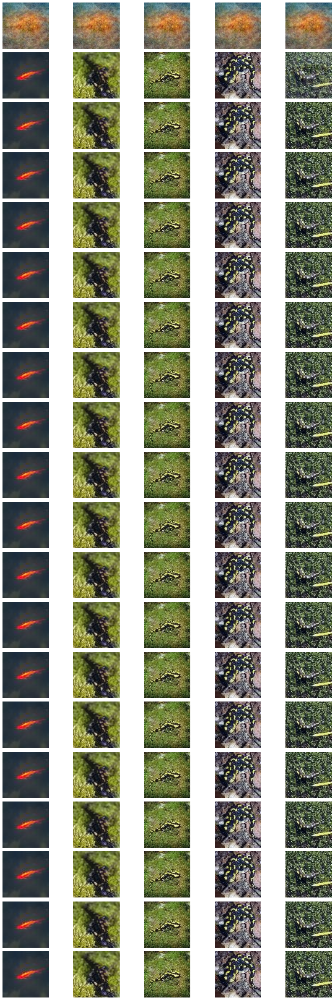

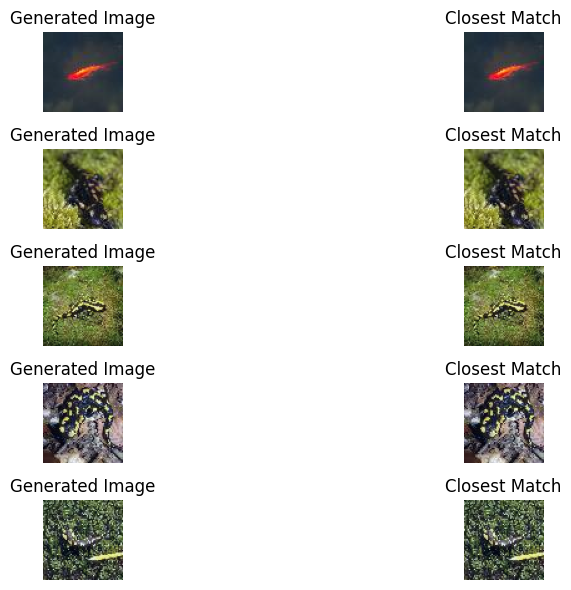

In [13]:
predictions = compute_predictions(trajectory, num_steps=num_steps)
visualize_image_trajectory(predictions, num_time_points=min(num_steps, 20))  # Show time points
generated_images = trajectory[-1]

min_mses, closest_indices = find_closest_matches(
    generated_images, images, device = device)

display_comparisons(generated_images, images, 
                       closest_indices,
                       num_display=5, figsize=(12, 6),
                       filename="results/analytic_comparison_fixed_seed.png")

# Theoretical Minimum Losses

Due to compute costs, this was skipped for ImageNet.

In [14]:
"""
# User-defined parameters
num_time_points = 10     # Number of time evaluations
num_batches = 100      # Number of batches at each time point
batch_size = 2          # Samples per batch
device = 'cuda' if torch.cuda.is_available() else 'cpu'

loss_fn = torch.nn.MSELoss()
output_dist = images

# Preparation
output_dist = output_dist.to(device)  # Move once to avoid many transfers
subset_indices = torch.arange(len(subset), device=device)
time_points = torch.linspace(0, 1, num_time_points + 1, device=device)[:-1]
losses = torch.zeros(num_time_points, device='cpu')  # Store on CPU

for i, t in enumerate(time_points):
    total_loss = 0.0

    for _ in range(num_batches):
        with torch.no_grad():
            idx_output = subset_indices[torch.randint(0, len(subset), (batch_size,), device=device)]
            real_batch = output_dist[idx_output]
            noise_batch = torch.randn_like(real_batch)

            x_t = (1 - t) * noise_batch + t * real_batch
            target_velocity = real_batch - noise_batch

            # Compute predicted velocity
            pred_velocity = compute_linear_velocity_batch(x_t, output_dist, t, sigma_i=1.0)

            # Accumulate loss on CPU to reduce GPU load
            loss = loss_fn(pred_velocity, target_velocity).item()
            total_loss += loss

    losses[i] = total_loss / num_batches

# Convert to numpy for plotting
time_points = time_points.cpu().numpy()
losses = losses.cpu().numpy()
"""

"\n# User-defined parameters\nnum_time_points = 10     # Number of time evaluations\nnum_batches = 100      # Number of batches at each time point\nbatch_size = 2          # Samples per batch\ndevice = 'cuda' if torch.cuda.is_available() else 'cpu'\n\nloss_fn = torch.nn.MSELoss()\noutput_dist = images\n\n# Preparation\noutput_dist = output_dist.to(device)  # Move once to avoid many transfers\nsubset_indices = torch.arange(len(subset), device=device)\ntime_points = torch.linspace(0, 1, num_time_points + 1, device=device)[:-1]\nlosses = torch.zeros(num_time_points, device='cpu')  # Store on CPU\n\nfor i, t in enumerate(time_points):\n    total_loss = 0.0\n\n    for _ in range(num_batches):\n        with torch.no_grad():\n            idx_output = subset_indices[torch.randint(0, len(subset), (batch_size,), device=device)]\n            real_batch = output_dist[idx_output]\n            noise_batch = torch.randn_like(real_batch)\n\n            x_t = (1 - t) * noise_batch + t * real_batch\n   

In [15]:
"""
# Plot results
plt.figure(figsize=(10, 5))
plt.plot(time_points, losses, 'o-', label='Optimal Flow-Matching Loss')
plt.xlabel('Time t', fontsize = 20)
plt.ylabel('MSE Loss', fontsize = 20)
plt.title(f'CIFAR-10 - {num_batches*batch_size} Samples per Time Point', fontsize = 20)
plt.savefig('results/Loss_ImageNet.png')
plt.grid(True)
plt.legend(fontsize = 20)
plt.show()

print(f"Average loss across all time points: {np.mean(losses):.4f}")
"""

'\n# Plot results\nplt.figure(figsize=(10, 5))\nplt.plot(time_points, losses, \'o-\', label=\'Optimal Flow-Matching Loss\')\nplt.xlabel(\'Time t\', fontsize = 20)\nplt.ylabel(\'MSE Loss\', fontsize = 20)\nplt.title(f\'CIFAR-10 - {num_batches*batch_size} Samples per Time Point\', fontsize = 20)\nplt.savefig(\'results/Loss_ImageNet.png\')\nplt.grid(True)\nplt.legend(fontsize = 20)\nplt.show()\n\nprint(f"Average loss across all time points: {np.mean(losses):.4f}")\n'